# 📓 Working with CSV Files in GeoPandas
Converting a CSV file with latitude and longitude into a GeoDataFrame using GeoPandas involves a few key steps. This notebook walks through the process.

## Step 1: Import Required Libraries
First, we import Pandas for handling data, GeoPandas for geospatial analysis, and `Point` from Shapely to create geometry from coordinates.

In [1]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
%matplotlib inline

The last line, ```%matplotlib inline```, is called "Jupyter magic". When a command starts with a `%` sign, it is a Jupyter command, not a Python command. They tell Jupyter how to behave. This particular one lets you see maps and graphs inside of your notebook, instead  of having to process them separately.

## Step 2: Read the CSV File
GeoPandas cannot directly read CSV files using `gpd.read_file()`. You must use Pandas to read the CSV, which usually contains rows with attributes and coordinates.

In [2]:
df = pd.read_csv("../../geopandas_101_DATA/us/Power_Plants_in_the_US.csv")
df.head()

,FID,OBJECTID,Plant_Code,Plant_Name,Utility_ID,Utility_Na,sector_nam,Street_Add,City,County,...,NG_MW,Nuclear_MW,Crude_MW,Solar_MW,Wind_MW,Other_MW,Source,Period,Longitude,Latitude
0,1,62897,1873,Tower,20910,Wolverine Power Supply Coop,Electric Utility,9663 Cooperative Road,Tower,Cheboygan,...,0,0.0,19.3,0.0,0,0.0,"EIA-860, EIA-860M and EIA-923",202502.0,-84.29497,45.36282
1,2,62898,1874,Caro,18895,Thumb Electric Coop of Mich,Electric Utility,2437 East Dayton Road,Caro,Tuscola,...,0,0.0,8.5,0.0,0,0.0,"EIA-860, EIA-860M and EIA-923",202502.0,-83.32780,43.46590
2,3,62899,1875,Ubly,18895,Thumb Electric Coop of Mich,Electric Utility,4159 Ubly Road,Ubly,Huron,...,0,0.0,12.3,0.0,0,0.0,"EIA-860, EIA-860M and EIA-923",202502.0,-82.93880,43.72170
3,4,62900,1877,George Johnson,20910,Wolverine Power Supply Coop,Electric Utility,1529 S 170th Ave,Hersey,Osceola,...,48.7,0.0,1.0,0.0,0,0.0,"EIA-860, EIA-860M and EIA-923",202502.0,-85.42600,43.83930
4,5,62901,1880,Claude Vandyke,20910,Wolverine Power Supply Coop,Electric Utility,3150 143rd Ave,Dorr,Allegan,...,20.2,0.0,0.0,0.0,0,0.0,"EIA-860, EIA-860M and EIA-923",202502.0,-85.85510,42.73100


## Step 3: Create Geometry with Shapely Points
Shapely's `Point` takes longitude and latitude and returns a geometry object. Remember: **Longitude comes first**, then **Latitude**. If you get it backwards, your points may appear in the wrong place on the map.

In [3]:
# Convert each row to a Point geometry
# Make sure your column names match your CSV file
points = df.apply(lambda row: Point(row["Longitude"], row["Latitude"]), axis=1)

In [4]:
print(type(points))
print(type(points[0]))

<class 'pandas.core.series.Series'>
<class 'shapely.geometry.point.Point'>


⚠️ By default, `df.apply()` works column-wise. You need to set `axis=1` to apply the function row-by-row.

## Step 4: Construct a GeoDataFrame
You cannot simply add a geometry column to a Pandas DataFrame and expect it to behave like a GeoDataFrame. You need to explicitly construct a new GeoDataFrame with both the original data and the geometry.

In [5]:
powerplants = gpd.GeoDataFrame(df, geometry=points)

# # Another method:
# powerplants = gpd.GeoDataFrame(
#     df,
#     geometry=gpd.points_from_xy(x=df['Longitude'], y=df['Latitude'])
# )

# # Or if we have the geojson file available:
# plants_url = "../../geopandas_101_DATA/us/Power_Plants_in_the_US_5860152164617264051.geojson"
# powerplants = gpd.read_file(plants_url)

powerplants

,FID,OBJECTID,Plant_Code,Plant_Name,Utility_ID,Utility_Na,sector_nam,Street_Add,City,County,...,Nuclear_MW,Crude_MW,Solar_MW,Wind_MW,Other_MW,Source,Period,Longitude,Latitude,geometry
0,1,62897,1873,Tower,20910,Wolverine Power Supply Coop,Electric Utility,9663 Cooperative Road,Tower,Cheboygan,...,0.0,19.3,0.0,0,0.0,"EIA-860, EIA-860M and EIA-923",202502.0,-84.294970,45.362820,POINT (-84.29497 45.36282)
1,2,62898,1874,Caro,18895,Thumb Electric Coop of Mich,Electric Utility,2437 East Dayton Road,Caro,Tuscola,...,0.0,8.5,0.0,0,0.0,"EIA-860, EIA-860M and EIA-923",202502.0,-83.327800,43.465900,POINT (-83.3278 43.4659)
2,3,62899,1875,Ubly,18895,Thumb Electric Coop of Mich,Electric Utility,4159 Ubly Road,Ubly,Huron,...,0.0,12.3,0.0,0,0.0,"EIA-860, EIA-860M and EIA-923",202502.0,-82.938800,43.721700,POINT (-82.9388 43.7217)
3,4,62900,1877,George Johnson,20910,Wolverine Power Supply Coop,Electric Utility,1529 S 170th Ave,Hersey,Osceola,...,0.0,1.0,0.0,0,0.0,"EIA-860, EIA-860M and EIA-923",202502.0,-85.426000,43.839300,POINT (-85.426 43.8393)
4,5,62901,1880,Claude Vandyke,20910,Wolverine Power Supply Coop,Electric Utility,3150 143rd Ave,Dorr,Allegan,...,0.0,0.0,0.0,0,0.0,"EIA-860, EIA-860M and EIA-923",202502.0,-85.855100,42.731000,POINT (-85.8551 42.731)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13446,13442,75538,68798,Lockheed Martin Palmdale Solar PV,57266,Lockheed Martin Corporation,Industrial Non-CHP,,,,...,0.0,0.0,20.0,0,0.0,"EIA-860, EIA-860M and EIA-923",202502.0,-118.109000,34.608000,POINT (-118.109 34.608)
13447,13443,75539,68804,Rivard 1,61194,Generate Capital,IPP Non-CHP,,,,...,0.0,0.0,4.6,0,0.0,"EIA-860, EIA-860M and EIA-923",202502.0,-79.281723,42.502750,POINT (-79.28172 42.50275)
13448,13444,75540,68806,Ridgeway 2,61194,Generate Capital,IPP Non-CHP,,,,...,0.0,0.0,2.5,0,0.0,"EIA-860, EIA-860M and EIA-923",202502.0,-77.742717,43.189134,POINT (-77.74272 43.18913)
13449,13445,75541,68807,Catskill,61194,Generate Capital,IPP Non-CHP,,,,...,0.0,0.0,3.8,0,0.0,"EIA-860, EIA-860M and EIA-923",202502.0,-75.903449,42.337823,POINT (-75.90345 42.33782)


## Step 5: Set the Coordinate Reference System (CRS)
To tell GeoPandas that your coordinates are latitude and longitude, set the CRS to `'EPSG:4326'`, which is the standard for geographic coordinates.

In [7]:
powerplants = powerplants.set_crs(epsg=4326)

In [8]:
display(powerplants.crs)

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

## Step 6: Explore and Visualize
You can inspect the data and quickly plot it using built-in GeoPandas methods.

<Axes: >

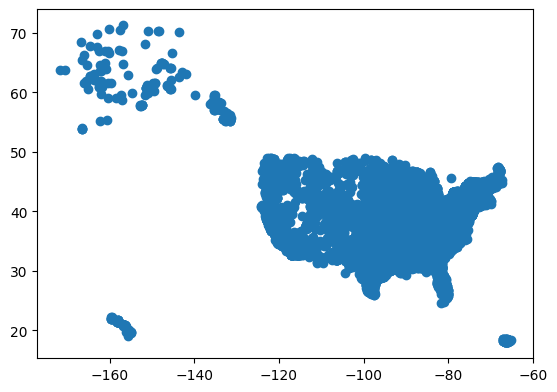

In [9]:
powerplants.plot()

In [10]:
powerplants.explore()

## ⚠️ Troubleshooting Tips
- **Column Names**: Make sure `longitude` and `latitude` match the exact column names in your CSV.
- If your coordinates are labeled differently (e.g., `lon`, `lat`, `x`, `y`), update the lambda function accordingly.
- Remember that GeoPandas expects geometry in `(longitude, latitude)` order.
- Always set the CRS to `'EPSG:4326'` after creating the GeoDataFrame.

## ✅ Summary
1. Read the CSV with Pandas.
2. Convert coordinates to Shapely `Point` objects.
3. Create a new GeoDataFrame with geometry.
4. Set the CRS to `'EPSG:4326'`.

These steps will work for any CSV file with latitude and longitude. Just update the file name and column references.